In [13]:
import csv                                                                      #for reading data from csv file
import numpy as np
from matplotlib import pyplot                                       #for printing images
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset                  #for easy iteration of batches
from torch.utils.data import DataLoader
import torch.optim as optim
import matplotlib.pyplot as plt
import pandas as pd
import time
# import torchvision
# import torchvision.transforms as transforms
# import matplotlib.pyplot as plt
# import random
# import tensorflow as tf
# from pathlib import Path
# import requests
# import pickle
# import gzip
# import math
from google.colab import drive
from statistics import mean
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
path = 'drive/My Drive/Kaggle_MNIST_data/'

#loading train data

fields=[]           #taking out the first row which contains headers
y_temp=[]
x_temp=[]

csv_file=open(path+'train.csv', 'r')
csvreader=csv.reader(csv_file)
fields=next(csvreader)

for row in csvreader:

    y_temp.append(row[0])
    x_temp.append(np.asarray(row[1:], dtype=float))

x_train_np=np.asarray(x_temp)
y_train_np=np.asarray(y_temp, dtype=int)

x_train, y_train = map(torch.tensor, (x_train_np, y_train_np))

print(x_train.shape, y_train.shape)



torch.Size([42000, 784]) torch.Size([42000])


In [0]:
#loading test data

csv_file_test=open(path+'test.csv', 'r')
csvreader_test=csv.reader(csv_file_test)

fields_test=[]
x_temp_test=[]

fields_test=next(csvreader_test)

for row in csvreader_test:
    x_temp_test.append(np.asarray(row, dtype=float))

x_test_np=np.asarray(x_temp_test)
x_test=torch.tensor(x_test_np)

image label:  tensor(8)


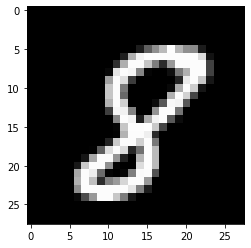

In [4]:
#viewing images

#train image view
plt.imshow(x_train[105].reshape(28, 28), cmap='gray')
print('image label: ', y_train[105])


torch.Size([28000, 784])


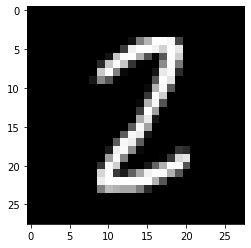

In [5]:

#test image view
plt.imshow(x_test[102].reshape(28, 28), cmap='gray')
print((x_test.shape))

In [0]:
BatchSize=64
epochs=5
num_classes=10
learning_rate=0.001

# def preprocess(x, y):
    
#     x=x/255.0
#     x=x.reshape(-1, 1, 28, 28)

#     return x, y

x_train=x_train/255.0
x_train=x_train.reshape(-1, 1, 28, 28)

x_test=x_test/255.0
x_test=x_test.reshape(-1, 1, 28, 28)

train_ds = TensorDataset(x_train, y_train)
test_ds = TensorDataset(x_test)

train_dl = DataLoader(train_ds, batch_size = BatchSize, shuffle=True)
test_dl = DataLoader(test_ds, batch_size = BatchSize, shuffle=False)


# def get_data(train_ds, bs):
    
#     return DataLoader(train_ds, batch_size=bs, shuffle=True)

# class WrappedDataLoader:

#     def __init__(self, dl, func):
#         self.dl = dl
#         self.func = func

#     def __len__(self):
#         return len(self.dl)

#     def __iter__(self):
#         batches = iter(self.dl)
#         for batch in batches:
#             yield(self.func(*batch))

In [0]:
class CNN_model(nn.Module):

    def __init__(self):

        super().__init__()
        
        #convs
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=2, padding=2)
        self.conv3 = nn.Conv2d(32, 48, kernel_size=3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(48, 64, kernel_size=3, stride=1, padding=1)

        #linear
        self.fc1 = nn.Linear(64*7*7, 1024)
        self.fc2 = nn.Linear(1024, 10)

        #batch_norm
        self.b_norm1 = nn.BatchNorm2d(16)
        self.b_norm2 = nn.BatchNorm2d(32)
        self.b_norm3 = nn.BatchNorm2d(48)
        self.b_norm4 = nn.BatchNorm2d(64)
        self.b_norm5 = nn.BatchNorm1d(1024)
        self.b_norm6=nn.BatchNorm1d(10)

        #dropouts
        self.drop1 = nn.Dropout2d(p=0.4)
        self.drop2 = nn.Dropout(p=0.4)


        # self.layer1=nn.Sequential(
        #     nn.Conv2d(1, 32, kernel_size=5, stride=1, padding=2),
        #     nn.ReLU(),
        #     nn.MaxPool2d(kernel_size=2, stride=2))

        # self.layer2=nn.Sequential(
        #     nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2),
        #     nn.ReLU(),
        #     nn.MaxPool2d(kernel_size=2, stride=2))

        # self.drop=nn.Dropout()
        # self.fc1=nn.Linear(7*7*64, 1000)
        # self.fc2=nn.Linear(1000, 10)

    def forward(self, xb):

        xb=xb.view(-1, 1, 28, 28)

        #layer 1
        out=F.relu(self.conv1(xb))
        out=self.b_norm1(out)
        # print(out.size())

        #layer 2
        out=F.relu(self.conv2(out))
        out=self.b_norm2(out)
        # print(out.size())

        #layer 3
        out=F.relu(self.conv3(out))
        out=self.b_norm3(out)
        # print(out.size())

        #layer 4
        out=F.relu(self.conv4(out))
        out=self.b_norm4(out)
        out=F.avg_pool2d(out, 2, stride=2)
        out=self.drop1(out)
        # print(out.size())`       

        out=out.reshape(out.size(0), -1)

        #fc1
        out=F.relu(self.fc1(out))
        out=self.b_norm5(out)
        out=self.drop2(out)

        #fc2
        out=self.fc2(out)
        out=self.b_norm6(out)
        
        return out

        # out = self.layer1(xb)
        # out = self.layer2(out)

        # out=out.reshape(out.size(0), -1)

        # out=self.drop(out)

        # out=self.fc1(out)
        # out=self.fc2(out)

        return out




In [0]:
model=CNN_model()

#loss fxn and optimiser

loss_fn=nn.CrossEntropyLoss()
opt=optim.Adam(model.parameters(), lr=learning_rate)

In [9]:
# training the model

total_steps=len(train_dl)
losses=[]
acc=[]
for epoch in range(epochs):
    for i, (xb, yb) in enumerate(train_dl):
        
        y_pred=model(xb.float())
        loss=loss_fn(y_pred, yb)
        losses.append(loss.item())

        opt.zero_grad()
        loss.backward()
        opt.step()

        total=yb.size(0)

        _, prediction = torch.max(y_pred.data, 1)
        correct=(prediction==yb).sum().item()
        acc.append(correct/total)

        if i%100 == 99:

            print('Epoch [{}/{}]   Step [{}/{}]   Loss {}    Accuracy {}'.format(epoch+1, epochs, i+1, total_steps, loss.item(), 100*(correct/total)))



Epoch [1/5]   Step [100/657]   Loss 0.4408186972141266    Accuracy 96.875
Epoch [1/5]   Step [200/657]   Loss 0.44295158982276917    Accuracy 96.875
Epoch [1/5]   Step [300/657]   Loss 0.28814461827278137    Accuracy 98.4375
Epoch [1/5]   Step [400/657]   Loss 0.23858942091464996    Accuracy 98.4375
Epoch [1/5]   Step [500/657]   Loss 0.3294483423233032    Accuracy 93.75
Epoch [1/5]   Step [600/657]   Loss 0.18288534879684448    Accuracy 100.0
Epoch [2/5]   Step [100/657]   Loss 0.13853691518306732    Accuracy 100.0
Epoch [2/5]   Step [200/657]   Loss 0.24254125356674194    Accuracy 96.875
Epoch [2/5]   Step [300/657]   Loss 0.21591712534427643    Accuracy 96.875
Epoch [2/5]   Step [400/657]   Loss 0.11667192727327347    Accuracy 100.0
Epoch [2/5]   Step [500/657]   Loss 0.19240328669548035    Accuracy 95.3125
Epoch [2/5]   Step [600/657]   Loss 0.20024192333221436    Accuracy 95.3125
Epoch [3/5]   Step [100/657]   Loss 0.10395871102809906    Accuracy 100.0
Epoch [3/5]   Step [200/657]

In [10]:
print(mean(acc))

0.9844891552511416


torch.Size([28000, 784])


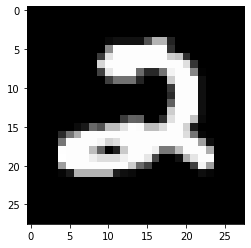

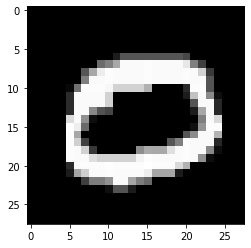

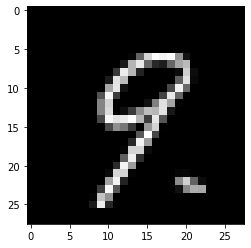

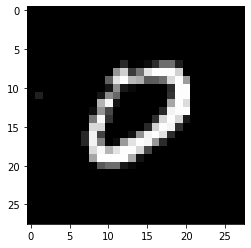

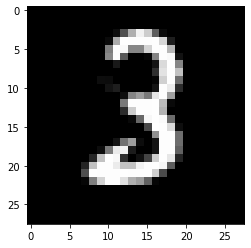

...

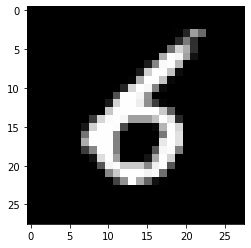

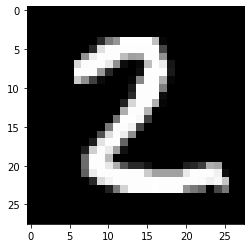

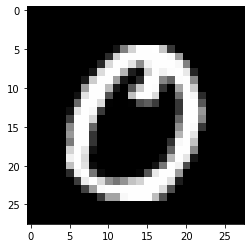

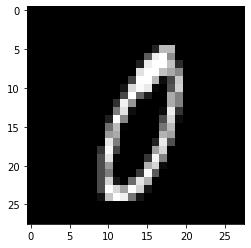

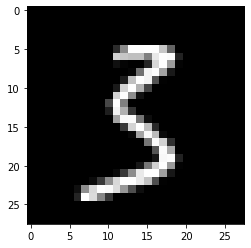

In [0]:
#testing images

test_imgs=x_test.clone().detach()
test_imgs=test_imgs.reshape(test_imgs.shape[0], -1)
print(test_imgs.shape)
for i, img in enumerate(test_imgs):
    plt.imshow(img.reshape(28, 28), cmap='gray')
    plt.show()
  

In [12]:
model.eval()

with torch.no_grad():

    print(x_test.shape)
    print(x_test)

    y_pred_test=model(x_test.float())
    print(y_pred_test)
    # _, prediction=torch.max(y_pred_test.data, 1)
    prediction=torch.argmax(y_pred_test, axis=1, keepdim=True)
    print(prediction)

    prediction_np=np.reshape(prediction, prediction.shape[0])
    print(prediction_np.shape)

    imageID_row=pd.Series(range(1, prediction_np.shape[0]+1), name="ImageId")
    label_row=pd.Series(prediction_np, name="Label")

    sub=pd.concat([imageID_row, label_row], axis=1)
    sub.to_csv(path+"1st_Submission.csv", index=False)


    # for xb in test_dl:
    #     pred=model(xb[0].float())
    #     _, prediction = torch.max(pred.data, 1)
    #     print(prediction)
    #     for i, image in enumerate(xb[0]):
    #         # print('Prediction is : ', prediction[i][0])
    #         # plt.imshow(image.reshape(28, 28), cmap='grey')
    #         if i==1:
    #             plt.imshow((image.reshape(28, 28)), cmap='gray')

torch.Size([28000, 1, 28, 28])
tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        ...,


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
